In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

## Downloading locally
- The easiest way to install diad fit is by removing the #, and running this once per computer. When I update the code, you'll need to get the new tag off GitHub:
https://github.com/PennyWieser/DiadFit/tags
Right click on the top one, over the 'zip' icon, click copy link address
- If youve already done this for Ne, you dont need to do here too

In [2]:
#!pip install --upgrade "https://github.com/PennyWieser/DiadFit/archive/refs/tags/0.0.11.zip"

### This imports DiadFit, and gives you the version. In all communication with Penny, make sure you say the version!


In [3]:
import DiadFit as pf
pf.__version__

'0.0.36'

In [4]:
DayFolder=r'G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\Diad_Fitting_Nov22nd2022'
meta_path=DayFolder +  '\MetaData'
spectra_path=DayFolder + '\Spectra'

In [5]:
# This specifies what file type your Raman exported in. 
filetype='headless_txt' # Specifies raman file format 
file_ext='.txt'
prefix=False

## Now load the files of interest

In [6]:
Diad_Files_Weak = joblib.load('Diad_Files_Grp3.sav')

In [7]:
Diad_Files_Weak

['POC58.txt',
 'POC56.txt',
 'POC57-0.04.txt',
 'POC55.txt',
 'POC51.txt',
 'POC54.txt',
 'POC53.txt',
 'POC50.txt',
 'POC52.txt',
 'POC49.txt',
 'POC48.txt',
 'POC47.txt',
 'POC46.txt',
 'POC45.txt',
 'POC44.txt',
 'POC43.txt',
 'POC42.txt',
 'POC41.txt',
 'POC40.txt']

In [8]:
# Select one file to tweak fit on
filename_Weak='POC40.txt' # Diad_Files_Weak[0]
filename_Weak

'POC40.txt'

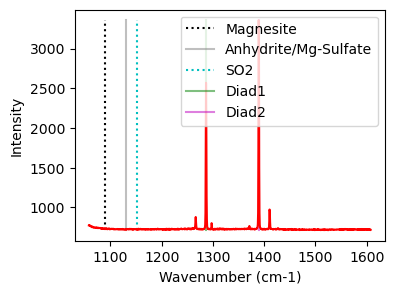

In [9]:
plot1=pf.plot_diad(path=spectra_path, filename=filename_Weak, filetype=filetype)

## Decide if you want a secondary peak
- If you dont have the peak, it is only a little slower, but it works if it only appears in a small number of spectra still

In [10]:
# Decide if you want to fit a carbonate peak or not here. 
fit_sec_peak=False

if fit_sec_peak is True:

    # Tweak options here, can exclude a range for example using exclude_range=Tuple[float, float]
    generic_Config=pf.generic_peak_config(lower_bck=(1110, 1130), 
    upper_bck=(1160, 1180), cent_generic=1150, name='SO2')

    generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
    filename=filename_Weak, filetype=filetype)
    generic_fit

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

In [11]:
diad_id_config=pf.diad_id_config(height=50)
diad_id_config

diad_id_config(exclude_range1=None, exclude_range2=None, approx_diad2_pos=(1379, 1395), approx_diad1_pos=(1275, 1295), Diad2_window=(1349, 1425), Diad1_window=(1245, 1325), approx_diad2_pos_3peaks=(1379, 1395, 1362), height=50, distance=5, threshold=0.5, width=0.5, prominence=10, plot_figure=True)

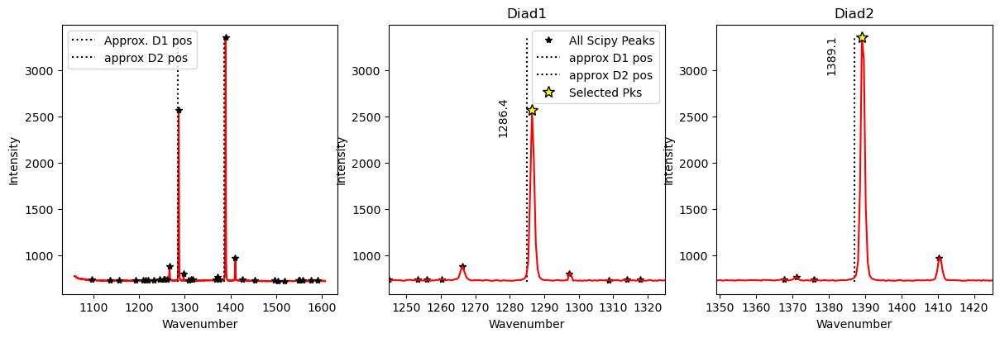

In [12]:
# Specify the number of peaks, 1 = just peak, 2 = Peak+hot bands
n_peaks_diad1=1
n_peaks_diad2=1
    
diad1_peaks, diad2_peaks=pf.identify_diad_peaks(
    config=diad_id_config, path=spectra_path, filename=filename_Weak,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, n_peaks_diad2=n_peaks_diad2)

In [13]:
print(diad1_peaks)
print(diad2_peaks)

(1286.444974,)
(1389.119077,)


In [14]:
## Choose a model - option, pseudovoigt or voigt
model_name='PseudoVoigtModel'

## Fit Diad 1
- You can tweak the parameters in diad1_fit_config

In [15]:
diad1_fit_config_init=pf.diad1_fit_config(model_name=model_name,
N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1230),upper_bck_diad1=(1310, 1350),
diad_sigma=0.5,
x_range_residual=10, x_range_baseline=30, HB_amplitude=5, diad_amplitude=1000)
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.5, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1230), upper_bck_diad1=(1310, 1350), diad_amplitude=1000, HB_amplitude=5, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Residual_Diad1,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1286.53594,1286.53594,2792.923815,0.644427,None,1863.2691,8.118094,0.26625,1.288855,Flagged Warnings:


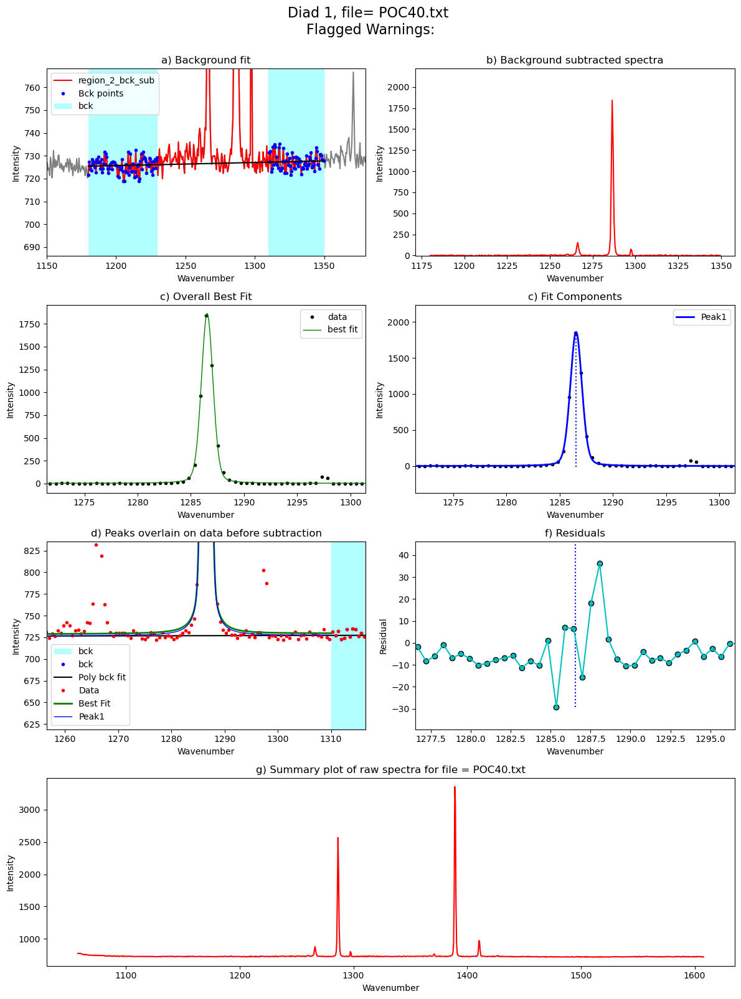

In [16]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad1_fit

In [17]:
### Now lets update the tweakable parameters with the sigma values
diad1_fit_config=diad1_fit_config_init
diad1_fit_config.diad_sigma=Diad1_fit['Diad1_Voigt_Sigma'][0]
diad1_fit_config.sigma_allowance=2
diad1_fit_config

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.6444273069883397, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1230), upper_bck_diad1=(1310, 1350), diad_amplitude=1000, HB_amplitude=5, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## Fit diad 2

In [18]:
diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
x_range_residual=10, 
diad_amplitude=1000, 
x_range_baseline=30)
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.2, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, C13_sigma=0.1, sigma_allowance=10, N_poly_bck_diad2=1, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=1000, HB_amplitude=20, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,Diad2_Combofit_Height,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit
0,1389.340082,1389.340082,4066.815325,0.596447,None,2908.975543,8.929312,0.287616,1.192894,Flagged Warnings:


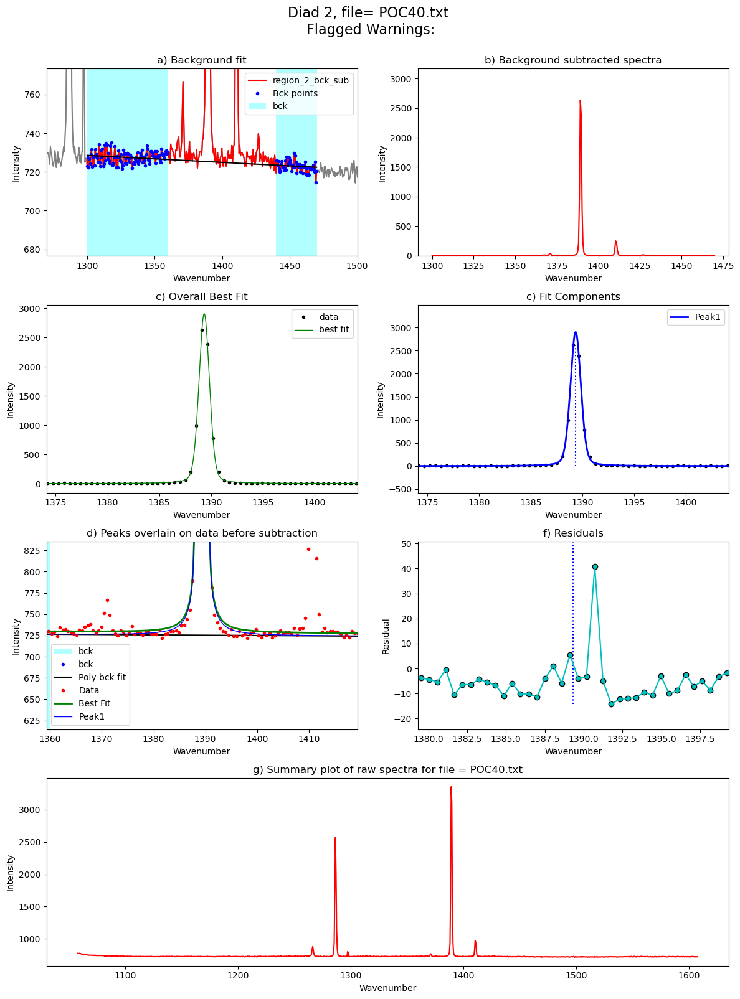

In [19]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config, peak_pos_voigt=diad2_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

In [20]:
Diad2_fit['Diad2_Combofit_Cent']-Diad1_fit['Diad1_Combofit_Cent']

0    102.804141
dtype: float64

In [21]:
# Update param with new sigma
diad2_fit_config=diad2_fit_config_init
diad2_fit_config.diad_sigma=Diad2_fit['Diad2_Voigt_Sigma'][0]
diad2_fit_config.diad_sigma_min_allowance=0.5
diad2_fit_config.diad_sigma_min_allowance=2
diad2_fit_config

diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.5964470357542201, diad_sigma_min_allowance=2, diad_sigma_max_allowance=5, C13_sigma=0.1, sigma_allowance=10, N_poly_bck_diad2=1, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=1000, HB_amplitude=20, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## You can also try looping if all your spectra are pretty similar

 53%|███████████████████████████████████████████▏                                      | 10/19 [00:18<00:17,  1.95s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:1902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))
100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:37<00:00,  1.95s/it]


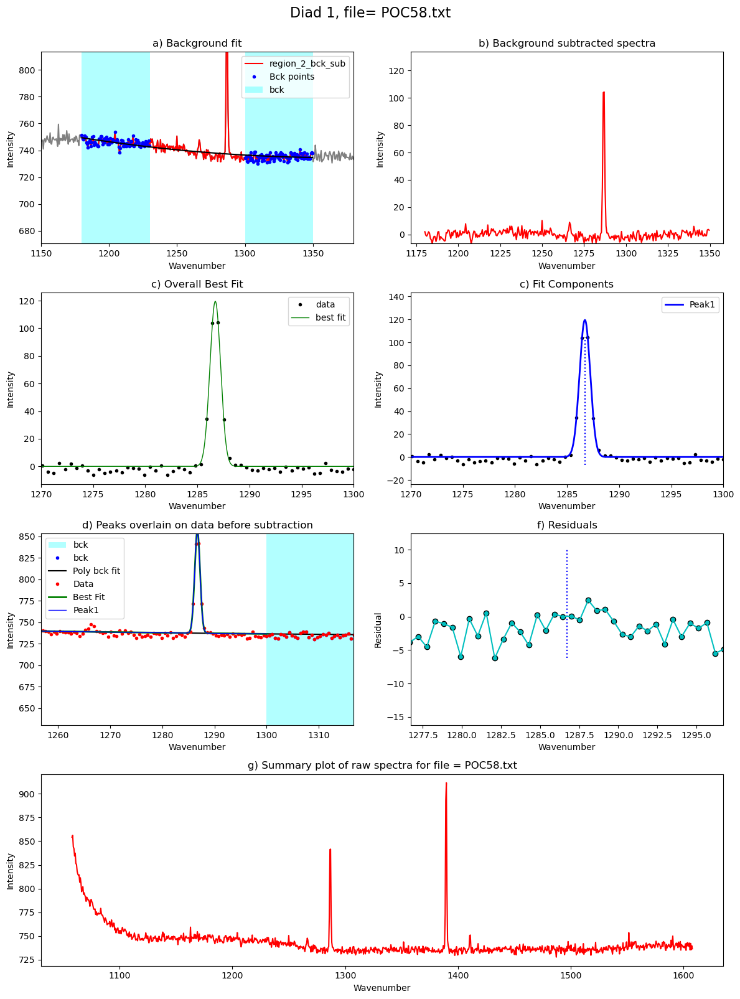

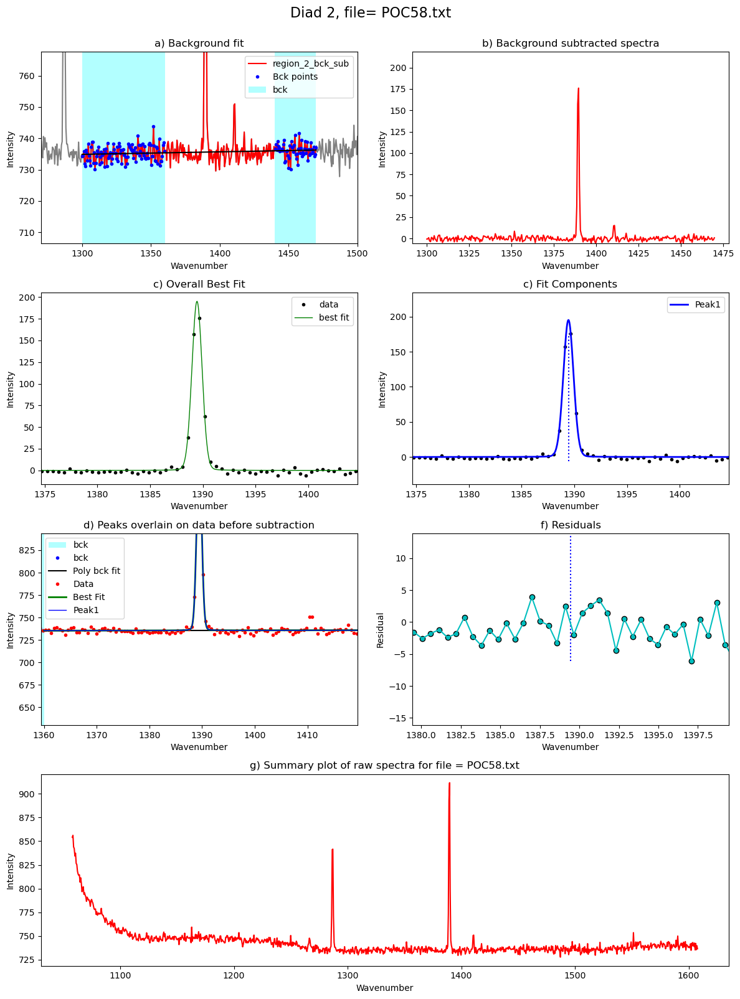

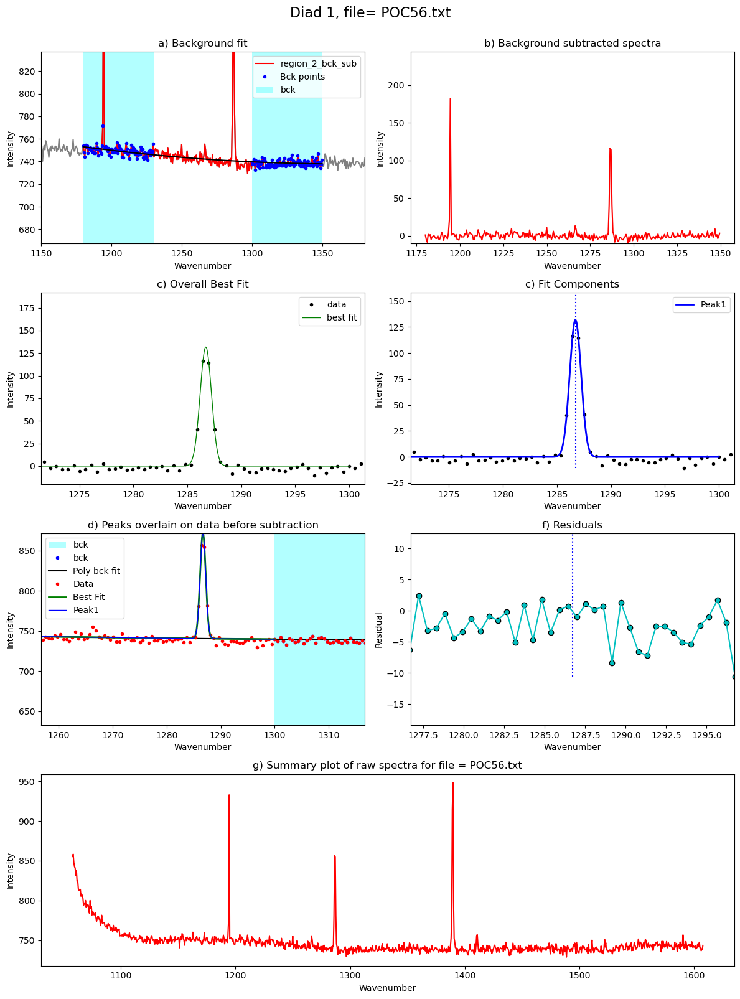

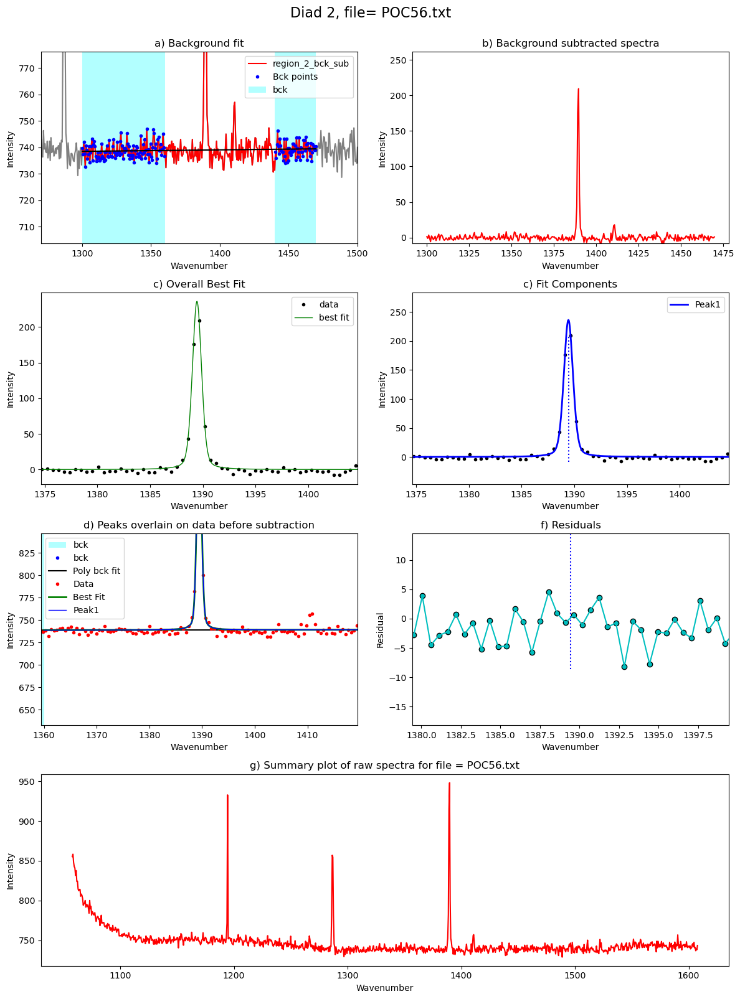

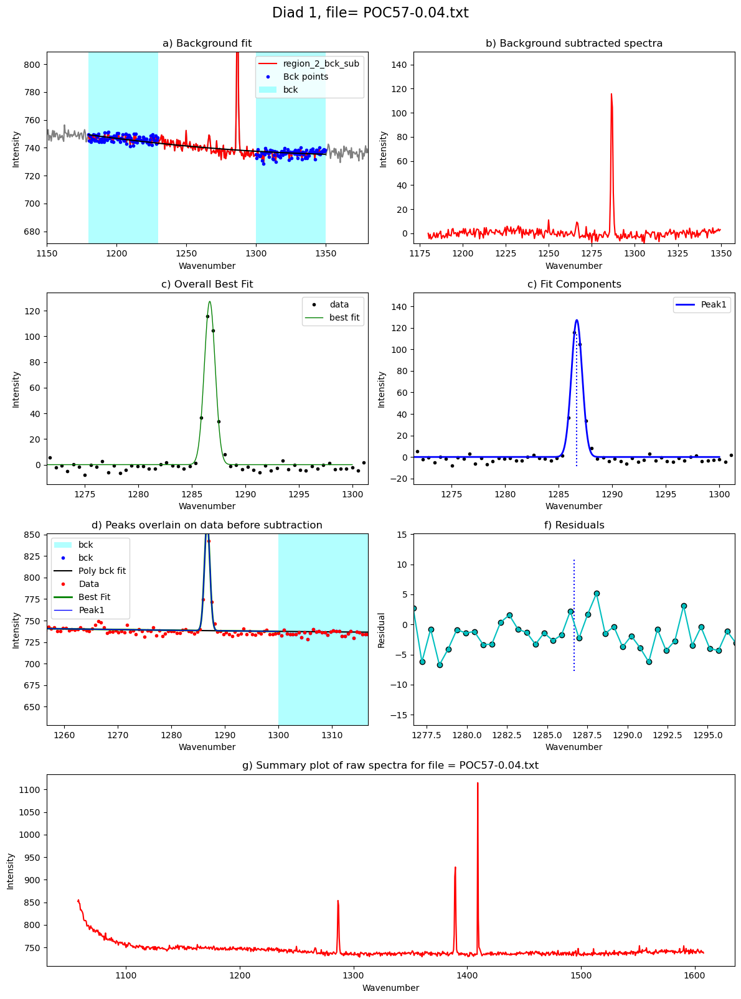

...

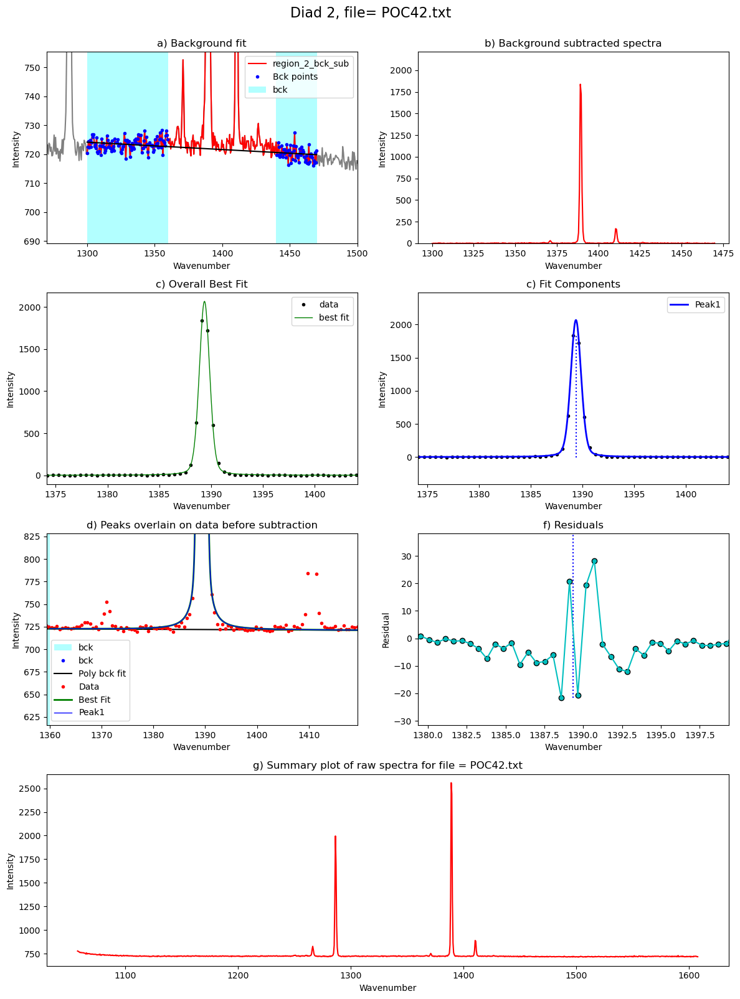

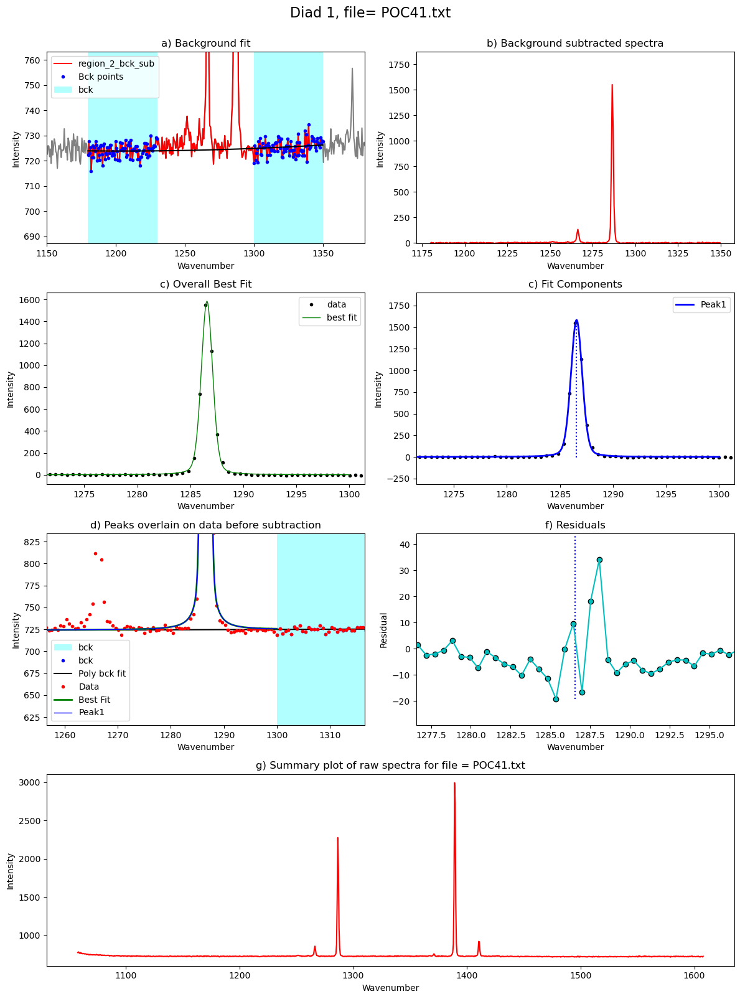

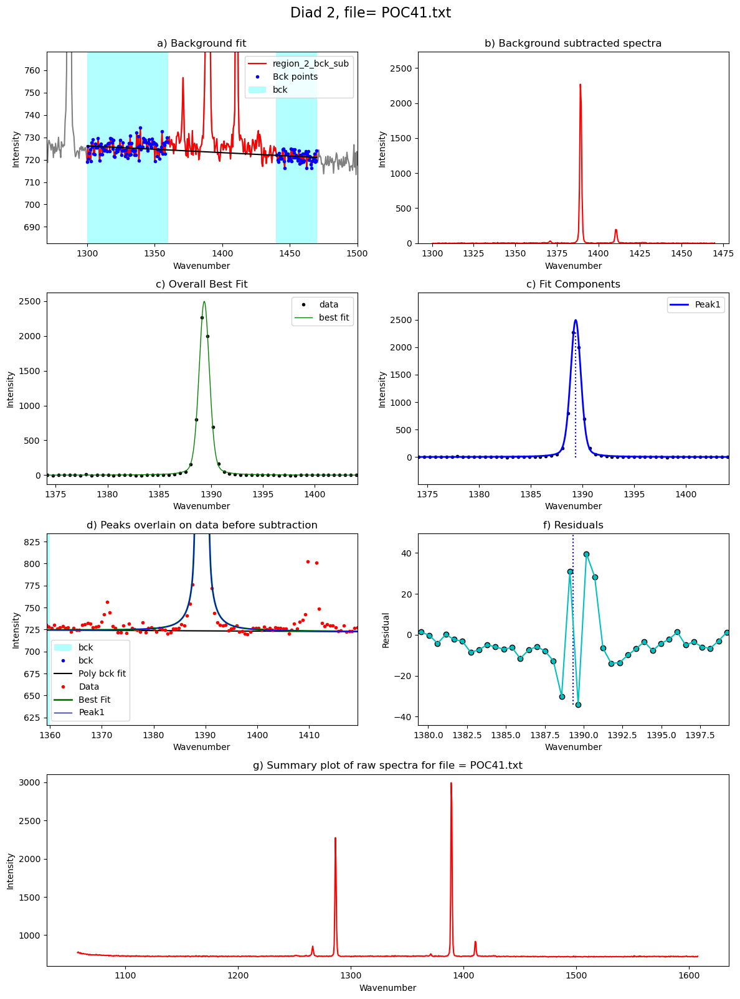

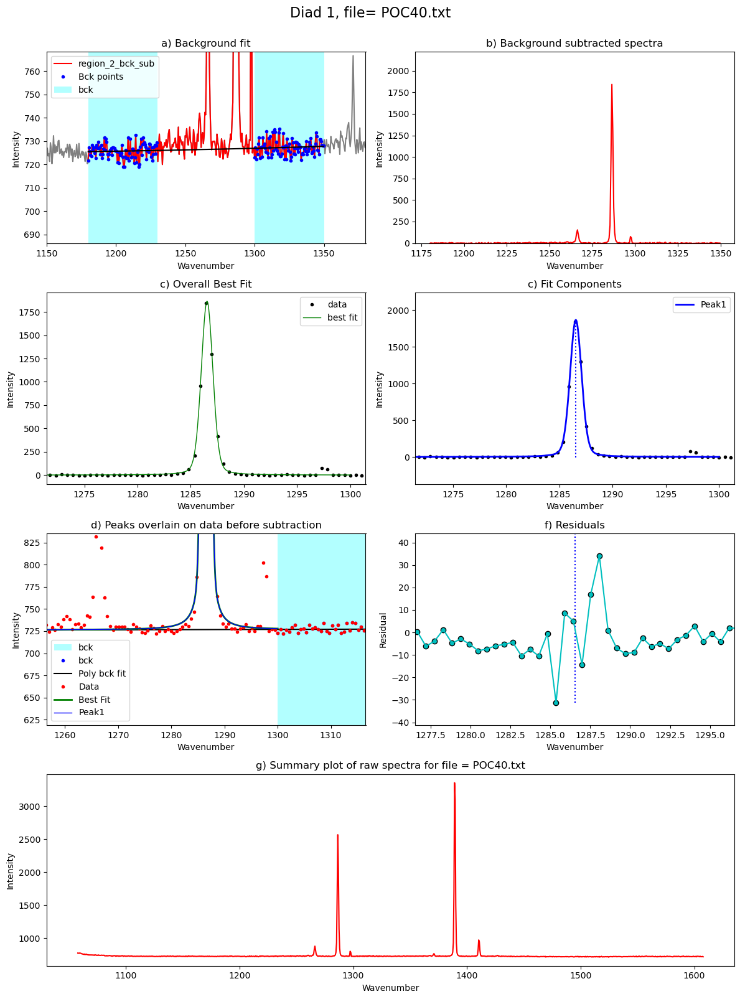

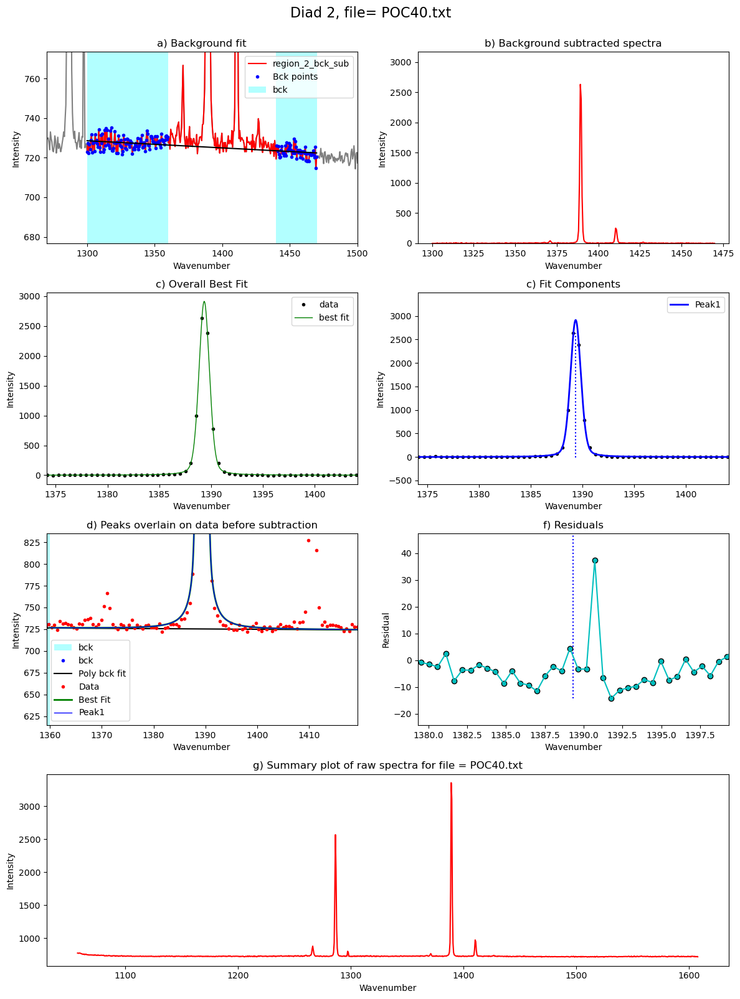

In [51]:
from tqdm import tqdm
plot_figure=True # If False, Means doesnt have to make figures, lot faster. 
close_figure=False # Means shows figures in the notebook itself
to_clipboard=False # Copies to clipboard
Diad_Files_Weak_i=Diad_Files_Weak
df_Weak = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files_Weak))): #
    
    filename=Diad_Files_Weak[i]

    if fit_sec_peak is True:
    
        generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
filename=filename, filetype=filetype)


    diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
            path=spectra_path, filename=filename,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
    n_peaks_diad2=n_peaks_diad2, plot_figure=False)

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config,
    config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)

    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config,
        config2=diad_id_config, peak_pos_voigt=diad2_peaks,
    path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)
    
    
    if fit_sec_peak is True:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=generic_fit)
    
    else:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit)        
    
 

    df_Weak = pd.concat([df_Weak, data], axis=0)


## Here are some figures to inspect the relationship between residuals and areas etc. 

In [52]:
# These ones triggered at least one warning, so need to be refit
refit_d1=(df_Weak['Diad1_refit']==True)
refit_d2=(df_Weak['Diad2_refit']==True)
refit=refit_d1|refit_d2

In [57]:
refit_names_1=df_Weak['filename'].loc[refit]
refit_names_1

for file in refit_names_1:
    img_diad1=spectra_path + '\\diad_fit_images'  + '\\Diad1_Fit_'+ str(file)  + '.png'
    img_diad2=spectra_path + '\\diad_fit_images'  + '\\Diad2_Fit_'+ str(file)  + '.png'
if sum(refit)>0:
    from IPython.display import Image
    Image(filename=img_diad1, width=500, height=1500) 
    from IPython.display import Image
    Image(filename=img_diad2, width=500, height=1500)     

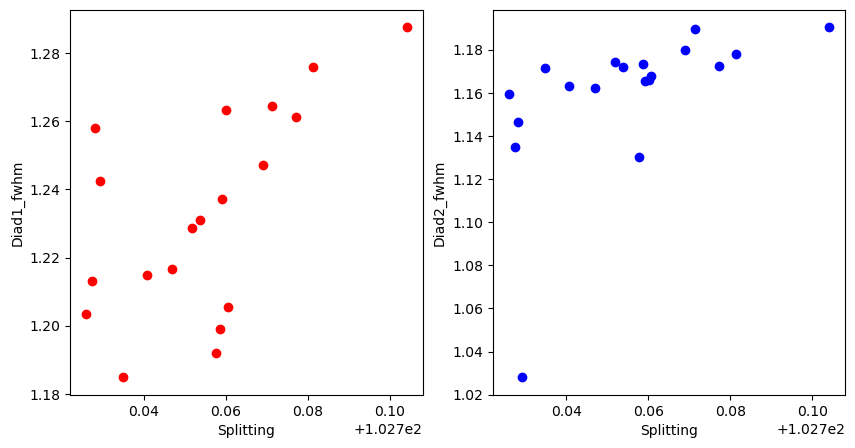

In [58]:

x='Splitting'
y1='Diad1_fwhm'
y2='Diad2_fwhm'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x], df_Weak[y1], 'or')
ax2.plot(df_Weak[x], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

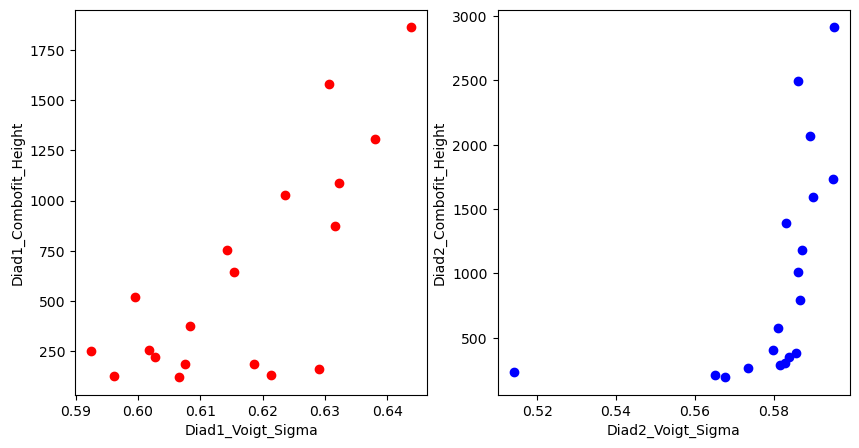

In [59]:
x1='Diad1_Voigt_Sigma'
x2='Diad2_Voigt_Sigma'
y1='Diad1_Combofit_Height'
y2='Diad2_Combofit_Height'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x1], df_Weak[y1], 'or')
ax2.plot(df_Weak[x2], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x1].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x2].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)

ax1.set_xlabel(x1)
ax1.set_ylabel(y1)
ax2.set_xlabel(x2)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

In [60]:
combo.to_excel('Weak_Diads.xlsx')

In [32]:
combo.to_clipboard(excel=True)

In [33]:
combo

,filename,Splitting,Diad1_Combofit_Cent,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Residual_Diad1,Diad1_Prop_Lor,...,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,HB1_Cent,HB1_Area,HB2_Cent,HB2_Area,C13_Cent,C13_Area
0,POC58,102.727425,1286.718255,119.573726,1286.718255,154.419207,0.606601,None,2.282336,1.317028e-08,...,2.026593,7.381800e-02,1.135002,False,NaN,0,NaN,0,NaN,0
0,POC56,102.729331,1286.714106,131.751518,1286.714106,174.262314,0.621278,None,2.924421,6.744835e-08,...,2.812965,3.684211e-01,1.028093,False,NaN,0,NaN,0,NaN,0
0,POC57-0.04,102.757676,1286.687839,127.269559,1286.687839,161.499927,0.596054,None,2.423680,4.740492e-09,...,5.291010,1.580404e-01,1.130122,False,NaN,0,NaN,0,NaN,0
0,POC55,102.728191,1286.707301,157.393742,1286.707301,210.778870,0.629039,None,2.895239,1.104344e-07,...,2.884913,9.346591e-10,1.146632,False,NaN,0,NaN,0,NaN,0
0,POC51,102.740746,1286.696529,183.276230,1286.696529,250.703563,0.607511,None,2.697510,1.690757e-01,...,2.725495,1.662824e-01,1.163020,False,NaN,0,NaN,0,NaN,0
0,POC54,102.759181,1286.683946,184.034094,1286.683946,242.334955,0.618523,None,2.988295,6.308953e-12,...,3.356460,1.528728e-02,1.165572,False,NaN,0,NaN,0,NaN,0
0,POC53,102.760690,1286.675363,220.627878,1286.675363,287.687395,0.602742,None,2.958261,4.936791e-02,...,3.223046,5.345539e-02,1.167778,False,NaN,0,NaN,0,NaN,0
0,POC50,102.726082,1286.691039,256.911938,1286.691039,340.578949,0.601709,None,2.291054,1.045284e-01,...,2.234457,1.377807e-01,1.159535,False,NaN,0,NaN,0,NaN,0
0,POC52,102.734883,1286.689150,247.355325,1286.689150,319.727982,0.592430,None,3.486822,7.522020e-02,...,3.046623,6.555301e-02,1.171323,False,NaN,0,NaN,0,NaN,0
0,POC49,102.746974,1286.664006,372.146576,1286.664006,502.530180,0.608254,None,2.409475,1.273300e-01,...,2.763872,1.951399e-01,1.162265,False,NaN,0,NaN,0,NaN,0
